# Reconhecimento de fundo e de objetos em vídeo

O objetivo do trabalho é usar o algoritmo de clusterização KMeans para reconhecer distinguir entre um objeto e o background de vídeos.

In [1]:
!pip install sk-video

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 10.9 MB/s eta 0:00:00


In [2]:
import skvideo.io
import numpy as np
import matplotlib.pyplot as plt
import random
from numba import prange
import plotly.express as px
from sklearn.cluster import KMeans
from tqdm import tqdm

# Um exemplo

Os testes foram feitos com trechos de um vídeo (disponível no [YouTube](https://www.youtube.com/watch?v=pGLK9YyJa3Y)), no qual é possível ver animais atravessando um tronco. Alguns critérios para a escolha do primeiro vídeo:

- Câmera fixa: Se a câmera permanece em uma posição fixa, a clusterização pode ser eficaz quando o foreground se move de maneira distinta em relação ao background estático.
- Objetos de cor única: Quando o objeto em primeiro plano possui uma cor ou textura única em comparação com o restante da cena, a clusterização pode destacar facilmente o objeto de interesse.
-  Objetos em movimento: Se o objeto em primeiro plano está em movimento constante, a clusterização pode ser útil para distinguir entre o objeto e o background.

No segundo exemplo, vamos ver o que acontece ao flexibilizar a última restrição.

Embora os exemplos tenham rastreado o caminho de animais, outras ideias de vídeos que funcionariam bem com o algoritmo:

- Rastreamento de pessoas;
- Experimentos de laboratório;
- Esportes (futebol, basquete, etc);
- Estradas com veículos.

In [3]:
video = skvideo.io.vread("video.mp4")
print(video.shape)

# 0) Number of frames
# 1) Number of rows
# 2) Number of cols
# 3) Number of channels

(389, 400, 848, 3)


Dos 389 frames do vídeo, usamos 20 frames aleatórios. Abaixo, estão os frames selecionados.

In [ ]:
n_frames = 20
frames_idx = []
for i in range(0, n_frames):
  frames_idx.append(random.randint(0, video.shape[0]))
print(frames_idx)

[96, 79, 312, 284, 172, 312, 293, 278, 247, 145, 101, 186, 110, 51, 171, 287, 321, 245, 99, 145]


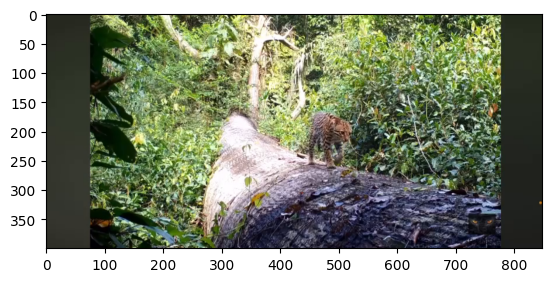

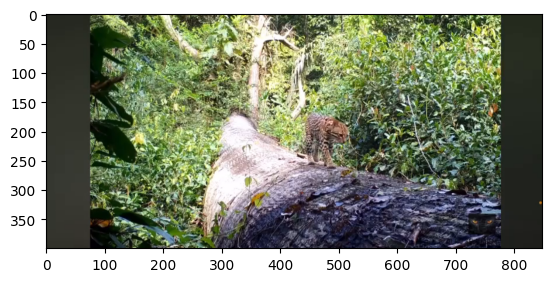

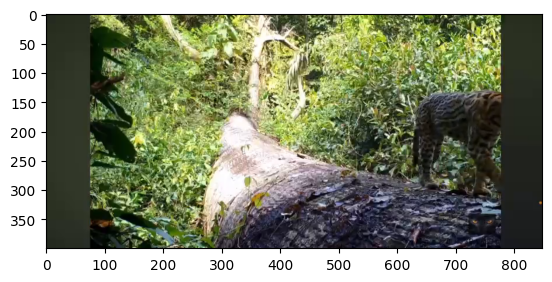

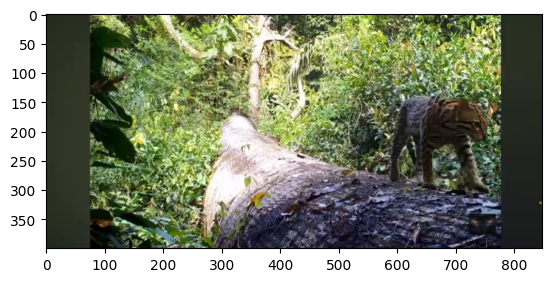

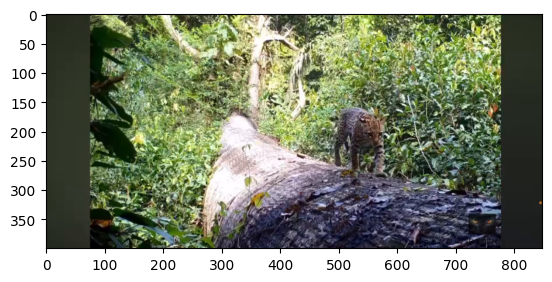

...

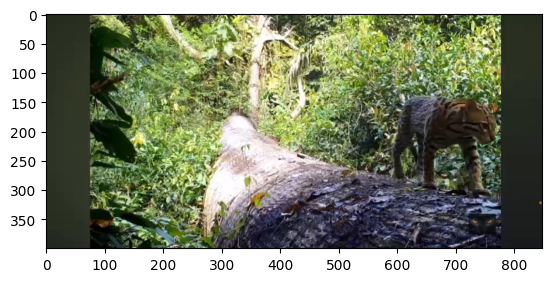

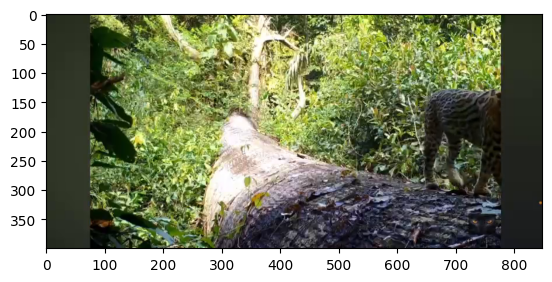

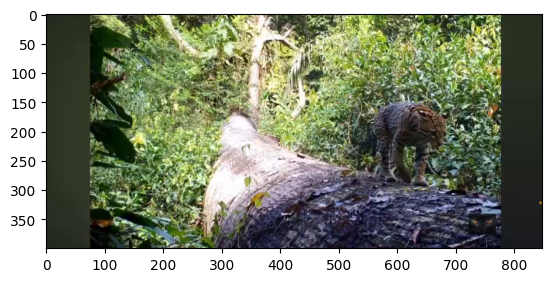

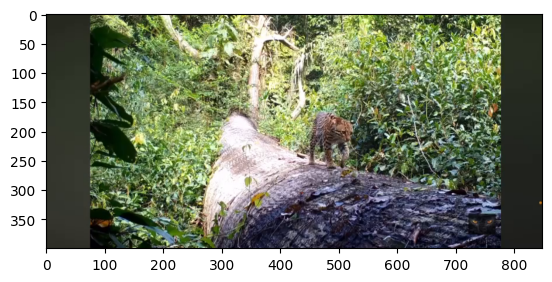

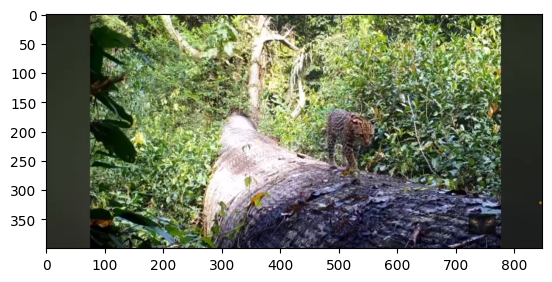

In [4]:
for frame in frames_idx:
  plt.imshow(video[frame])
  plt.show()

Podemos notar que alguns pixels permanecem quase inalterados em todo o vídeo. Um exemplo é o pixel circulado em vermelho, que durante todo o tempo do vídeo representa a folha de uma árvore, podendo sofrer pequenas variações do vento ou da iluminação. Em contrapartida, alguns pixels sofrem uma variação maior, especialmente os pixels em que tem o animal caminhando. Na imagem abaixo, vemos que o círculo em amarelo, ora tem o corpo do animal, ora tem o mato quando ele não está passando.

Iremos mostrar como a clusterização reage aos dos cenários.

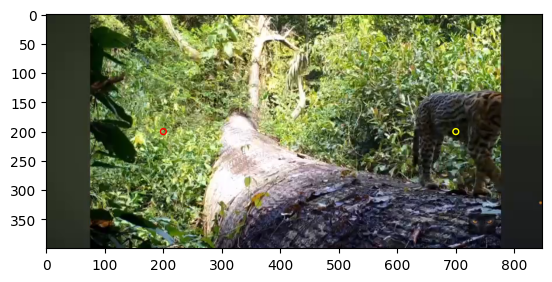

In [ ]:
plt.imshow(video[frames_idx[2]])

coord_x_var = 700
coord_y_var = 200

coord_x = 200
coord_y = 200

raio = 5

circulo = plt.Circle((coord_x, coord_y), raio, color='red', fill=False)

circulo_var = plt.Circle((coord_x_var, coord_y_var), raio, color='yellow', fill=False)

plt.gca().add_patch(circulo)
plt.gca().add_patch(circulo_var)

plt.savefig('imagem_com_circulos.png')
plt.show()

## Primeiro caso - pixels com variação

Para ver o que foi descrito acima, pegamos as cores RGB que o pixel circulado em amarelo assume nos 20 frames e plotamos abaixo. Podemos ver que existem claramente dois grupos bem definidos - a cor escura do animal e tons de verde da árvore. Plotando num gráfico 3D, em que os eixos são R, G, B, é possível ver a divisão dos dois grupos.




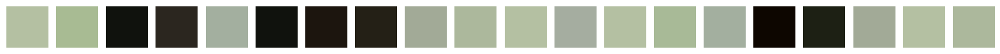

In [ ]:
colors_var = []
for i in range(20):
  colors_var.append(video[frames_idx[i]][coord_y_var][coord_x_var])
pontos_array = np.array(colors_var)

fig, ax = plt.subplots(1, len(colors_var), figsize=(len(colors_var), 1))

for i, rgb in enumerate(colors_var):
    ax[i].imshow([[rgb]], interpolation='nearest')
    ax[i].axis('off')

plt.savefig('cores_pixel_amarelo.png')
plt.show()

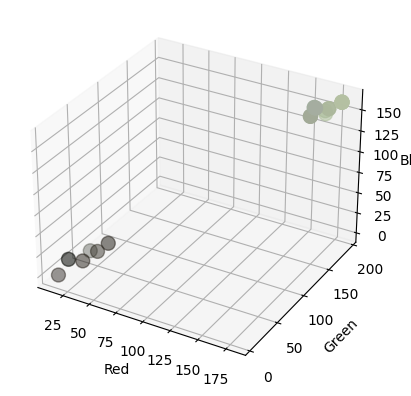

In [ ]:
fig = plt.figure()

ax = fig.add_subplot(111, projection='3d')

r, g, b = pontos_array[:, 0], pontos_array[:, 1], pontos_array[:, 2]

ax.scatter(r, g, b, c=pontos_array / 255.0, marker='o', s=100)

ax.set_xlabel('Red')
ax.set_ylabel('Green')
ax.set_zlabel('Blue')

plt.savefig('cores_amarelo_grafico.png')
plt.show()

Agora, usamos o algorimo KMeans para que ele ele gere os dois grupos que queremos - um do background e o do foreground. O algoritmo dá o rótulo para cada item da lista informando o grupo ao qual ele pertence (0 ou 1).

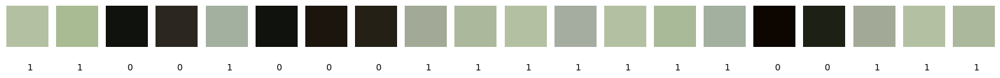

In [ ]:
ca = KMeans(n_clusters = 2, n_init=10)
ca = ca.fit(colors_var)
labels, counts = np.unique(ca.labels_, return_counts=True)
clusters = dict(zip(labels, counts))

fig, ax = plt.subplots(1, len(colors_var), figsize=(len(colors_var), 1))

for i, rgb in enumerate(colors_var):
    ax[i].imshow([[rgb]], interpolation='nearest')
    ax[i].axis('off')
    ax[i].text(0, 1.05, f'{ca.labels_[i]}')

plt.savefig('cores_amarelo_cluster.png', bbox_inches='tight')
plt.show()

Como o animal não fica estacionado em nenhum lugar, espera-se que para cada pixel, o cluster com mais elementos seja o fundo e o cluster com menos elementos seja o animal. Assim, para obter a imagem de fundo, pegamos as cores do cluster que mais se repetiu. Ok, mas agora qual delas representa melhor o fundo naquele pixel? No nosso caso, pegamos o valor que mais se repete de R, G e B dentre os pixels e juntamos para formar a cor RGB que representa o pixel de fundo naquele pixel.

Abaixo, é possível ver quem seria o pixel de fundo no exemplo que estamos trabalhando.

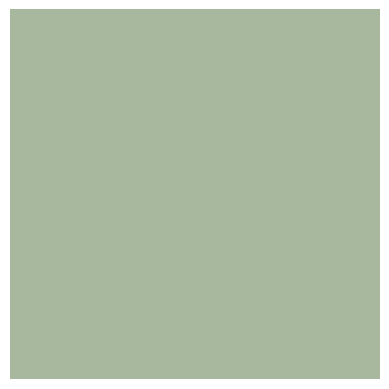

In [ ]:
most_common = max(clusters, key=clusters.get)
if most_common == 1:
  colors_var = [colors_var[i] for i in np.where(np.array(ca.labels_))[0]]
else:
  colors_var = [colors_var[i] for i in np.where(np.logical_not(np.array(ca.labels_)))[0]]
colors_a = np.array(colors_var)

pixel_rgb = (np.median(colors_a[:,0]), np.median(colors_a[:,1]), np.median(colors_a[:,2]))

imagem = np.zeros((1, 1, 3), dtype=np.uint8)
imagem[0, 0, :] = pixel_rgb

plt.imshow(imagem)
plt.axis('off')
plt.savefig('cor_pixel_amarelo.png')
plt.show()

## Segundo caso - pixels sem variação

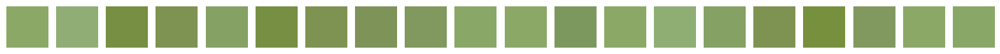

In [ ]:
colors_sem_var = []
for i in range(20):
  colors_sem_var.append(video[frames_idx[i]][200][200])

pontos_array = np.array(colors_sem_var)

fig, ax = plt.subplots(1, len(colors_sem_var), figsize=(len(colors_sem_var), 1))

for i, rgb in enumerate(colors_sem_var):
    ax[i].imshow([[rgb]], interpolation='nearest')
    ax[i].axis('off')
plt.savefig('cores_pixel_vermelho.png')
plt.show()

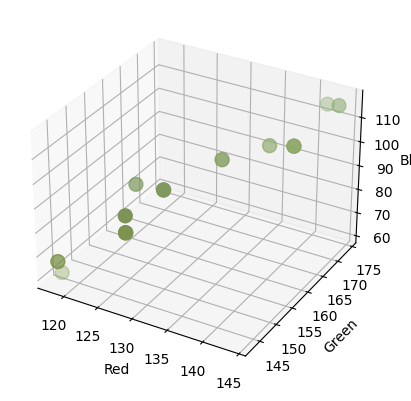

In [ ]:
fig = plt.figure()

ax = fig.add_subplot(111, projection='3d')

r, g, b = pontos_array[:, 0], pontos_array[:, 1], pontos_array[:, 2]

ax.scatter(r, g, b, c=pontos_array / 255.0, marker='o', s=100)

ax.set_xlabel('Red')
ax.set_ylabel('Green')
ax.set_zlabel('Blue')
plt.savefig('cores_vermelho_grafico.png')
plt.show()

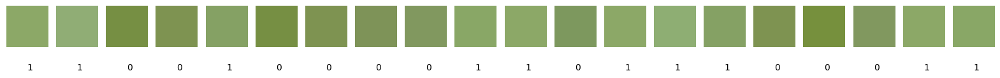

In [ ]:
ca = KMeans(n_clusters = 2, n_init=10)
ca = ca.fit(colors_sem_var)
labels, counts = np.unique(ca.labels_, return_counts=True)
clusters = dict(zip(labels, counts))

fig, ax = plt.subplots(1, len(colors_sem_var), figsize=(len(colors_sem_var), 1))

for i, rgb in enumerate(colors_sem_var):
    ax[i].imshow([[rgb]], interpolation='nearest')
    ax[i].axis('off')
    ax[i].text(0, 1.05, f'{ca.labels_[i]}')

plt.savefig('cores_vermelho_cluster.png', bbox_inches='tight')
plt.show()

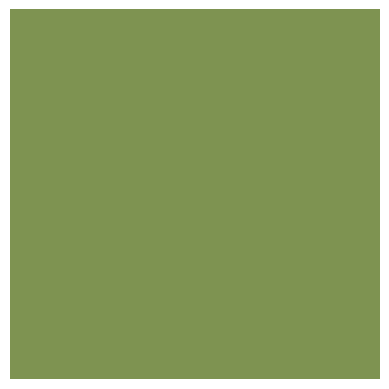

In [ ]:
most_common = max(clusters, key=clusters.get)
if most_common == 1:
  colors_sem_var = [colors_sem_var[i] for i in np.where(np.array(ca.labels_))[0]]
else:
  colors_sem_var = [colors_sem_var[i] for i in np.where(np.logical_not(np.array(ca.labels_)))[0]]
colors_a = np.array(colors_sem_var)

pixel_rgb = (np.median(colors_a[:,0]), np.median(colors_a[:,1]), np.median(colors_a[:,2]))

imagem = np.zeros((1, 1, 3), dtype=np.uint8)
imagem[0, 0, :] = pixel_rgb

plt.imshow(imagem)
plt.axis('off')
plt.savefig('cor_pixel_vermelho.png')
plt.show()

Agora que vimos como o algoritmo funciona para os dois tipos de pixels, podemos repetir para todos os pixels dos 20 frames. Assim, a função _encontra_background()_ recebe um vídeo e retorna a imagem de fundo.

In [7]:
def encontra_background(video):
  background = video[0]
  background.shape
  n_frames = 20
  frames_idx = []
  cols = video.shape[2]
  rows = video.shape[1]
  for i in range(0, n_frames):
    frames_idx.append(random.randint(0, video.shape[0]))
  for x in tqdm(prange(0, cols)):
    for y in prange(0, rows):
      colors=[]
      for z in frames_idx:
        colors.append(video[z][y][x])
      ca = KMeans(n_clusters = 2, n_init=10)
      ca = ca.fit(colors)
      labels, counts = np.unique(ca.labels_, return_counts=True)
      clusters = dict(zip(labels, counts))
      most_common = max(clusters, key=clusters.get)
      if most_common == 1:
        colors = [colors[i] for i in np.where(np.array(ca.labels_))[0]]
      else:
        colors = [colors[i] for i in np.where(np.logical_not(np.array(ca.labels_)))[0]]
      colors_a = np.array(colors)
      background_pixel = []
      background_pixel.append(np.median(colors_a[:,0]))
      background_pixel.append(np.median(colors_a[:,1]))
      background_pixel.append(np.median(colors_a[:,2]))
      background[y][x] = background_pixel
  return background

In [8]:
background=encontra_background(video)

100%|██████████| 848/848 [51:42<00:00,  3.66s/it]


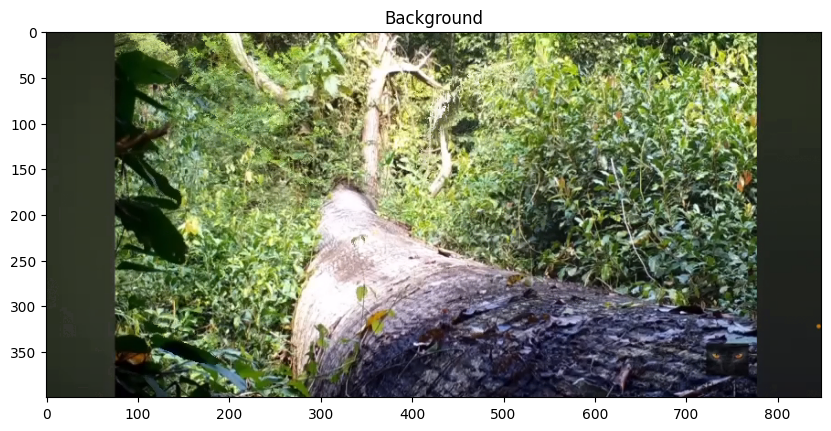

In [9]:
plt.figure(figsize=(10,10))
plt.imshow(background)
plt.title("Background")
plt.savefig('background.png')
plt.show()

Agora, podemos fazer mais alguns testes:
- Podemos substrair a imagem de fundo de qualquer um dos frames e ver a posição exata do animal.
- Podemos percorrer todos os frames do vídeo subtraindo a imagem de fundo para ver apenas o foreground do vídeo.

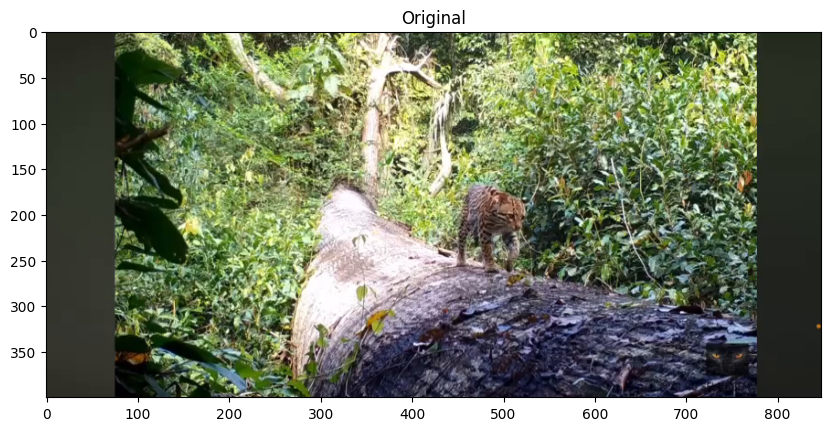

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(video[100])
plt.title("Original")
plt.show()

In [10]:
video = video.astype("int16")
background = background.astype("int16")

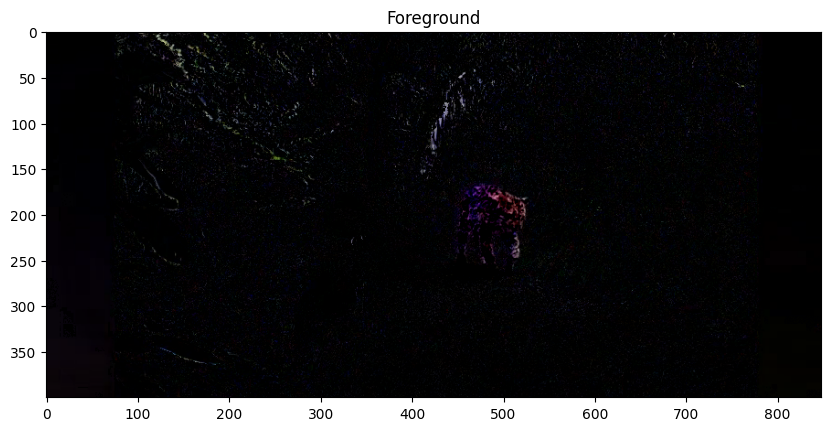

In [11]:
foreground = (video[100] - background)
np.clip(foreground, 0, 255, out=foreground)
plt.figure(figsize=(10,10))
plt.imshow(foreground)
plt.title("Foreground")
plt.show()

In [13]:
foreground = video.copy()
for i in range(0,foreground.shape[0]):
  foreground[i] = np.subtract(video[i], background)
  np.clip(foreground[i], 0, 255, out=foreground[i])
  foreground[i] = foreground[i].astype(np.uint8)

foreground = foreground.astype(np.uint8)
fps = skvideo.io.ffprobe("video.mp4")['video']['@r_frame_rate']

skvideo.io.vwrite("foreground2.mp4", foreground, inputdict={'-r': fps}, outputdict={'-r': fps})

# Outro exemplo... não tão legal

100%|██████████| 848/848 [45:11<00:00,  3.20s/it]


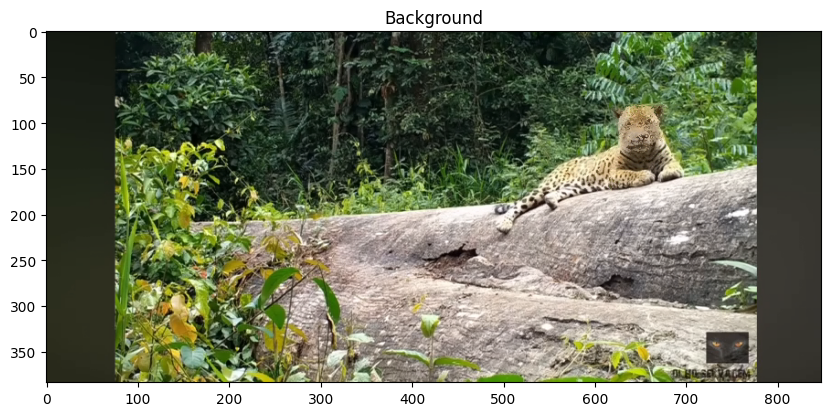

In [ ]:
video = skvideo.io.vread("video.mp4")
background = encontra_background(video)
plt.figure(figsize=(10,10))
plt.imshow(background)
plt.title("Background")
plt.show()

In [ ]:
foreground = video.copy()
for i in range(0,foreground.shape[0]):
  foreground[i] = np.subtract(video[i], background)
  np.clip(foreground[i], 0, 255, out=foreground[i])
  foreground[i] = foreground[i].astype(np.uint8)

foreground = foreground.astype(np.uint8)
skvideo.io.vwrite("foreground2.mp4", foreground)